In [ ]:
from google.colab import drive
import os
import pandas as pd

# Montar Google Drive
drive.mount('/content/drive')

# Ruta de la carpeta en Google Drive
folder_path = '/content/drive/My Drive/Palestina/'

# Listar los archivos en la carpeta
files = os.listdir(folder_path)
import pandas as pd

# Defineix la ruta del fitxer CSV
csv_path = '/content/drive/MyDrive/Palestina/count.csv'

# Llegeix el fitxer CSV
df = pd.read_csv(csv_path)





Mounted at /content/drive


In [ ]:
import pandas as pd

# Defineix les rutes dels fitxers CSV
dades_csv_path = '/content/drive/MyDrive/Palestina/dades.csv'
economics_csv_path = '/content/drive/MyDrive/Palestina/economics.csv'
fatalities_csv_path = '/content/drive/MyDrive/Palestina/fatalities.csv'
count_csv_path = '/content/drive/MyDrive/Palestina/count.csv'

# Llegeix els fitxers CSV
dades_df = pd.read_csv(dades_csv_path)
economics_df = pd.read_csv(economics_csv_path)
fatalities_df = pd.read_csv(fatalities_csv_path)
count_df = pd.read_csv(count_csv_path)

In [ ]:
# Convertir el PIB a nombres
economics_df['GDP (in USD)'] = economics_df['GDP (in USD)'].str.replace(' billion', '').str.replace(',', '').astype(float)
economics_df['Population'] = economics_df['Population'].str.replace(',', '').astype(float)


In [ ]:
pip install mpld3


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.6/202.6 kB 4.6 MB/s eta 0:00:00


L'arxiu HTML s'ha generat correctament.


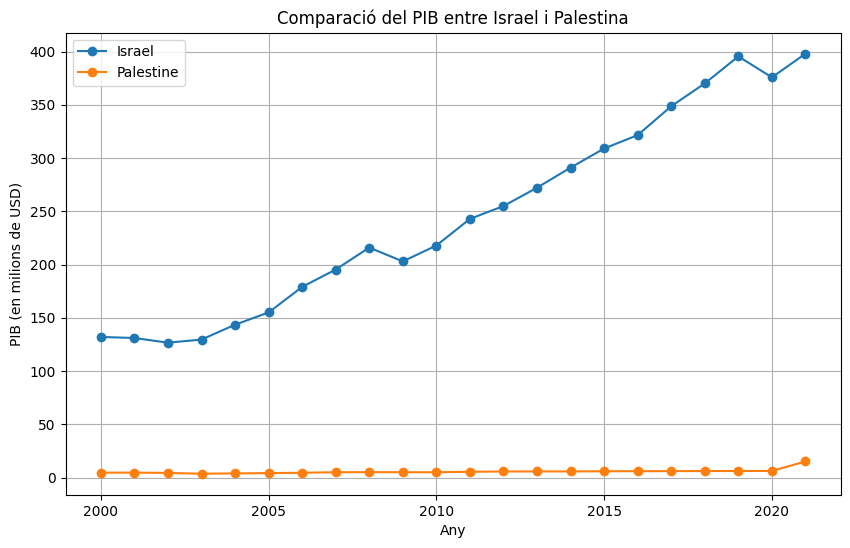

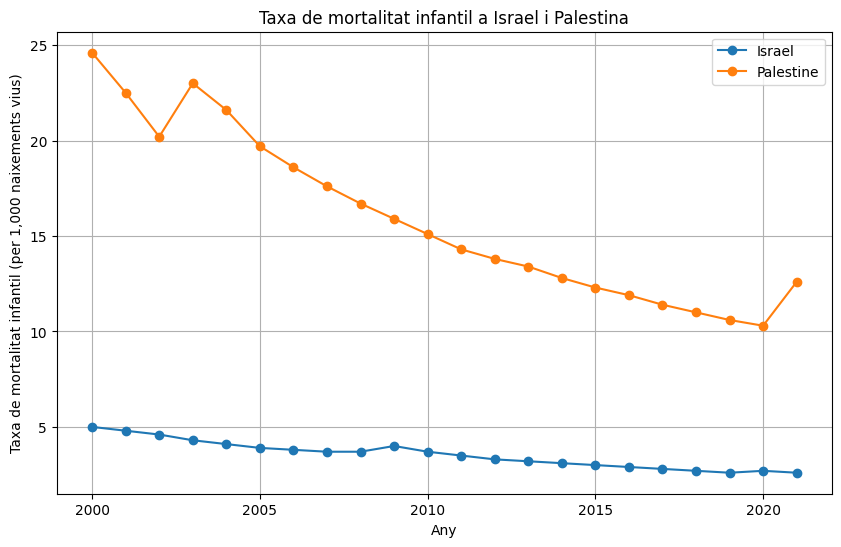

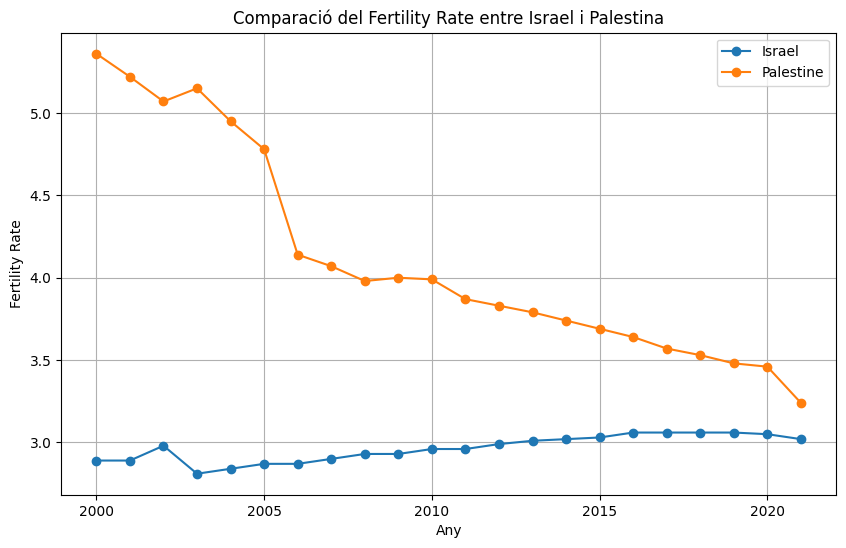

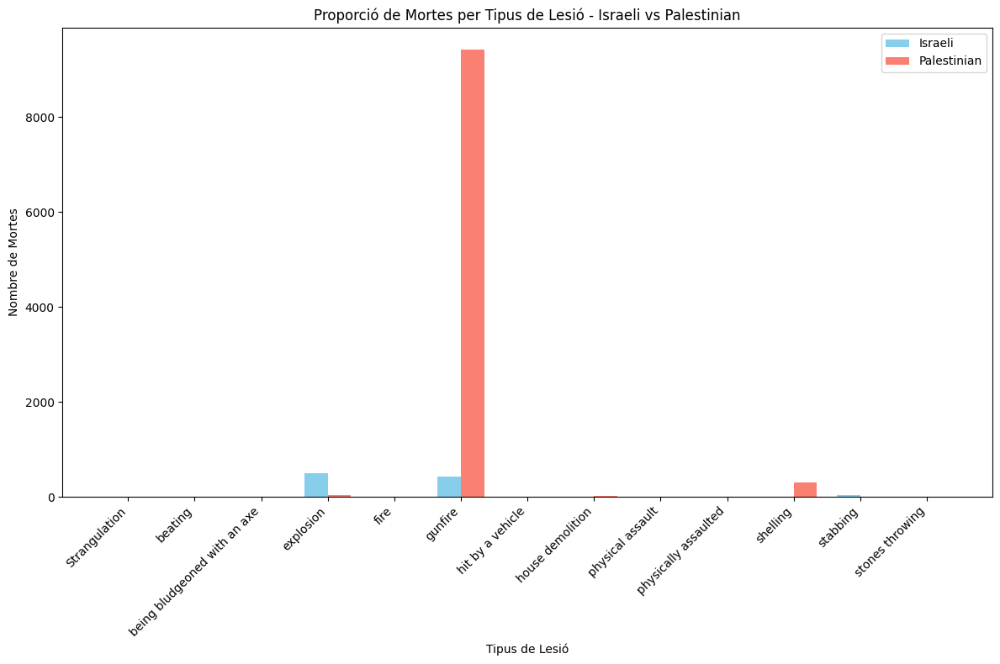

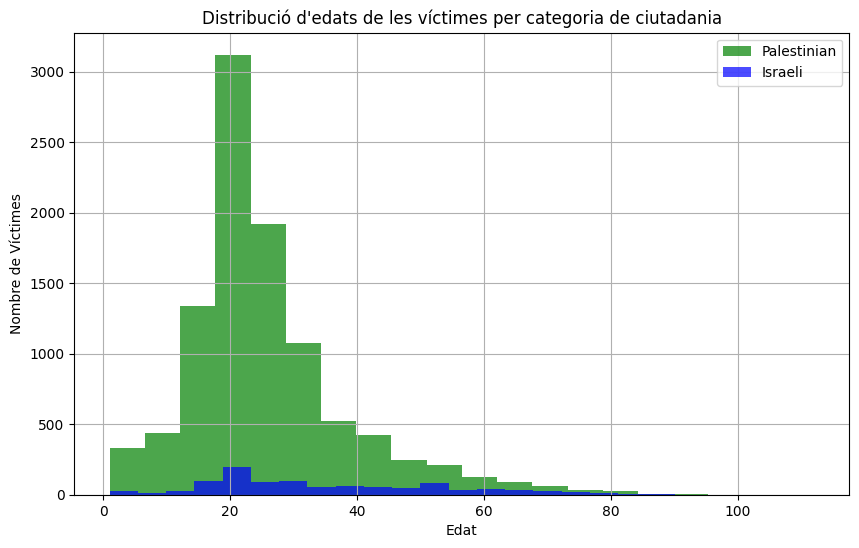

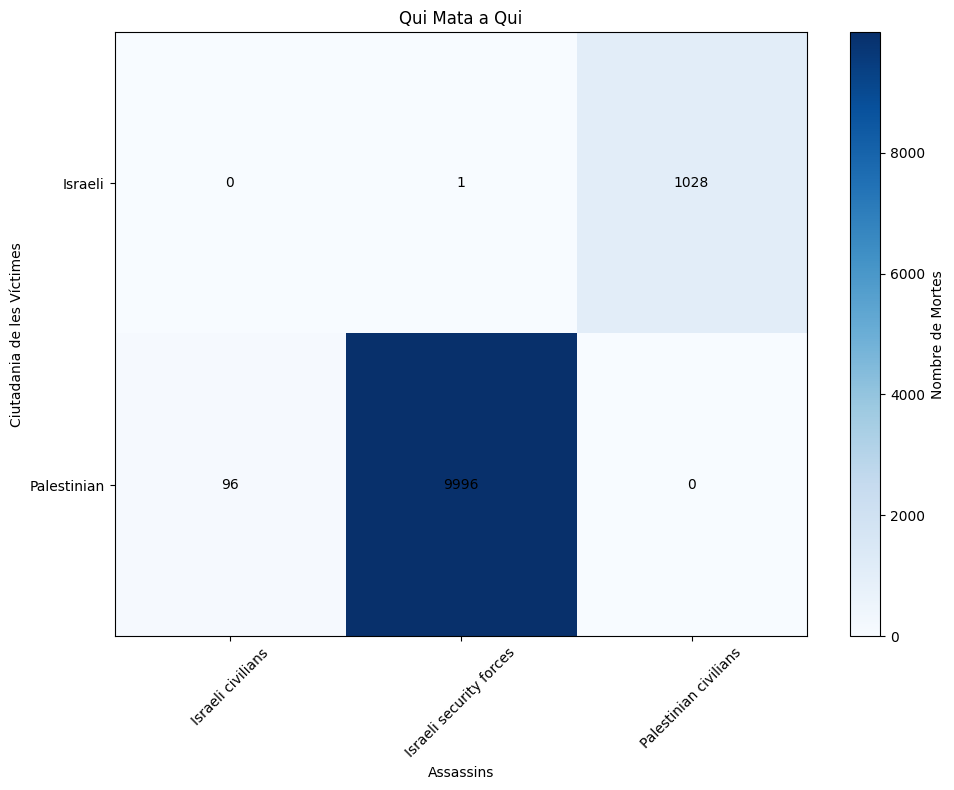

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import mpld3



# Filtrar les dades per Israel i Palestina
israel_data = economics_df[economics_df['Country'] == 'Israel']
palestine_data = economics_df[economics_df['Country'] == 'Palestine']

# Generar els gràfics amb matplotlib i convertir-los en HTML
html_parts = []

# PIB entre Israel i Palestina
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(israel_data['Year'], israel_data['GDP (in USD)'], label='Israel', marker='o')
ax.plot(palestine_data['Year'], palestine_data['GDP (in USD)'], label='Palestine', marker='o')
ax.set_title('Comparació del PIB entre Israel i Palestina')
ax.set_xlabel('Any')
ax.set_ylabel('PIB (en milions de USD)')
ax.legend()
ax.grid(True)
html_parts.append(mpld3.fig_to_html(fig))

# Taxa de mortalitat infantil a Israel i Palestina
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(israel_data['Year'], israel_data['Infant Mortality Rate (per 1,000 live births)'], label='Israel', marker='o')
ax.plot(palestine_data['Year'], palestine_data['Infant Mortality Rate (per 1,000 live births)'], label='Palestine', marker='o')
ax.set_title('Taxa de mortalitat infantil a Israel i Palestina')
ax.set_xlabel('Any')
ax.set_ylabel('Taxa de mortalitat infantil (per 1,000 naixements vius)')
ax.legend()
ax.grid(True)
html_parts.append(mpld3.fig_to_html(fig))

# Comparació del Fertility Rate entre Israel i Palestina
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(israel_data['Year'], israel_data['Fertility Rate'], label='Israel', marker='o')
ax.plot(palestine_data['Year'], palestine_data['Fertility Rate'], label='Palestine', marker='o')
ax.set_title('Comparació del Fertility Rate entre Israel i Palestina')
ax.set_xlabel('Any')
ax.set_ylabel('Fertility Rate')
ax.legend()
ax.grid(True)
html_parts.append(mpld3.fig_to_html(fig))

# Filtrar les dades per les categories "Israeli" i "Palestinian"
filtered_df = fatalities_df[fatalities_df['citizenship'].isin(['Israeli', 'Palestinian'])]

# Comptar el nombre de morts per tipus de lesió separats per la ciutadania
injury_counts_citizenship = filtered_df.groupby('citizenship')['type_of_injury'].value_counts().unstack().fillna(0)

# Comptar el nombre de morts per sexe separats per la ciutadania
gender_counts_citizenship = filtered_df.groupby('citizenship')['gender'].value_counts().unstack().fillna(0)

# Crear els gràfics de pastís per a la proporció de morts per sexe per cada ciutadania amb Plotly
figures_gender = []
for citizenship in ['Israeli', 'Palestinian']:
    fig = px.pie(names=gender_counts_citizenship.columns,
                 values=gender_counts_citizenship.loc[citizenship].values,
                 title=f'Proporció de Mortes per Sexe - {citizenship}')
    figures_gender.append(fig)

# Generar el codi HTML per a cada gràfic de pastís de Plotly
for fig in figures_gender:
    html_parts.append(fig.to_html(full_html=False))

# Gràfic de barres per proporció de mortes per tipus de lesió - Israeli vs Palestinian
fig, ax = plt.subplots(figsize=(12, 8))
n_bars = len(injury_counts_citizenship.columns)
bar_width = 0.35
index = np.arange(n_bars)
ax.bar(index, injury_counts_citizenship.loc['Israeli'], bar_width, label='Israeli', color='skyblue')
ax.bar(index + bar_width, injury_counts_citizenship.loc['Palestinian'], bar_width, label='Palestinian', color='salmon')
ax.set_xlabel('Tipus de Lesió')
ax.set_ylabel('Nombre de Mortes')
ax.set_title('Proporció de Mortes per Tipus de Lesió - Israeli vs Palestinian')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(injury_counts_citizenship.columns, rotation=45, ha='right')
ax.legend()
plt.tight_layout()
html_parts.append(mpld3.fig_to_html(fig))

# Histogrames d'edats de les víctimes per categoria de ciutadania
fig, ax = plt.subplots(figsize=(10, 6))
colors = ['green', 'blue']
for i, citizenship in enumerate(['Palestinian', 'Israeli']):
    age_data = filtered_df[filtered_df['citizenship'] == citizenship]['age']
    ax.hist(age_data, bins=20, alpha=0.7, label=citizenship, color=colors[i])
ax.set_title('Distribució d\'edats de les víctimes per categoria de ciutadania')
ax.set_xlabel('Edat')
ax.set_ylabel('Nombre de Víctimes')
ax.grid(True)
ax.legend()
html_parts.append(mpld3.fig_to_html(fig))

# Heatmap de qui mata a qui
kill_counts = filtered_df.groupby(['citizenship', 'killed_by']).size().unstack(fill_value=0)
fig, ax = plt.subplots(figsize=(10, 8))
heatmap = ax.imshow(kill_counts, cmap='Blues', aspect='auto')
plt.colorbar(heatmap, ax=ax, label='Nombre de Mortes')
ax.set_title('Qui Mata a Qui')
ax.set_xlabel('Assassins')
ax.set_ylabel('Ciutadania de les Víctimes')
ax.set_xticks(np.arange(len(kill_counts.columns)))
ax.set_xticklabels(kill_counts.columns, rotation=45)
ax.set_yticks(np.arange(len(kill_counts.index)))
ax.set_yticklabels(kill_counts.index)
for i in range(len(kill_counts.index)):
    for j in range(len(kill_counts.columns)):
        ax.text(j, i, kill_counts.iloc[i, j], ha='center', va='center', color='black')
plt.tight_layout()
html_parts.append(mpld3.fig_to_html(fig))

# Unir totes les parts HTML en un sol document
html_content = """
<!DOCTYPE html>
<html>
<head>
    <title>Visualitzacions Econòmiques i de Conflicte</title>
</head>
<body>
    <h1>Visualitzacions Econòmiques i de Conflicte entre Israel i Palestina</h1>
    {}
</body>
</html>
""".format("\n".join(html_parts))

# Guardar el contingut HTML en un fitxer
with open('visualizations.html', 'w', encoding='utf-8') as f:
    f.write(html_content)

print("L'arxiu HTML s'ha generat correctament.")


In [37]:
import pandas as pd
import folium
from folium.plugins import TimestampedGeoJson
import base64
import matplotlib.pyplot as plt
import io
import ipywidgets as widgets
from ipywidgets.embed import embed_minimal_html

# Convertir la columna 'event_date' a tipo datetime
dades_df['event_date'] = pd.to_datetime(dades_df['event_date'])

# Diccionario de colores para los tipos de eventos
event_type_colors = {
    'Protests': 'blue',
    'Strategic developments': 'green',
    'Battles': 'red',
    'Violence against civilians': 'orange',
    'Explosions/Remote violence': 'purple',
    'Riots': 'yellow'
}

# Funció per convertir el gràfic a imatge PNG en base64
def create_base64_image(dates, fatalities):
    fig, ax = plt.subplots()
    ax.plot(dates, fatalities, marker='o', linestyle='-')
    ax.set_title('Evolució de Fatalities')
    ax.invert_yaxis()
    ax.axis('off')

    buffer = io.BytesIO()
    plt.savefig(buffer, format='png', bbox_inches='tight')
    buffer.seek(0)
    image_base64 = base64.b64encode(buffer.read()).decode('utf-8')
    plt.close(fig)
    return image_base64

# Funció per crear el mapa interactiu filtrat per actor
def create_map(actor):
    filtered_df = dades_df[dades_df['actor1'] == actor]

    # Crear un mapa centrat a Israel
    m = folium.Map(location=[31.0461, 34.8516], zoom_start=7)

    # Llista per desar les característiques (features) GeoJSON
    features = []
    total_fatalities = 0
    fatalities_over_time = []

    # Iterar sobre cada fila del DataFrame filtrat i afegir cada esdeveniment al GeoJSON
    for index, row in filtered_df.iterrows():
        event_type = row['event_type']
        color = event_type_colors.get(event_type, 'black')

        fatalities = row['fatalities']

        total_fatalities += fatalities

        # Crear la característica (feature) GeoJSON per a cada esdeveniment
        feature = {
            'type': 'Feature',
            'geometry': {
                'type': 'Point',
                'coordinates': [row['longitude'], row['latitude']],
            },
            'properties': {
                'time': row['event_date'].strftime('%Y-%m-%d'),
                'style': {'color': color},
                'icon': 'circle',
                'popup': f"Tipus d'esdeveniment: {event_type}<br>Data: {row['event_date'].strftime('%Y-%m-%d')}<br>Fatalities: {fatalities}<br>Total de fatalities acumulades: {total_fatalities}<br>Font: {row['source']}<br>Sub Tipus d'Esdeveniment: {row['sub_event_type']}"
            }
        }
        features.append(feature)

        # Guardar la data i el total de fatalities acumulades per al gràfic
        fatalities_over_time.append((row['event_date'], total_fatalities))

    # Crear DataFrame per a les fatalities acumulades per dia
    fatalities_df = pd.DataFrame(fatalities_over_time, columns=['date', 'fatalities'])
    fatalities_df.set_index('date', inplace=True)
    fatalities_daily = fatalities_df.resample('D').last().fillna(method='ffill')
    dates = fatalities_daily.index.strftime('%Y-%m-%d').tolist()
    fatalities = fatalities_daily['fatalities'].tolist()

    # Crear objecte TimestampedGeoJson per afegir al mapa
    ts_geojson = TimestampedGeoJson({
        'type': 'FeatureCollection',
        'features': features,
    }, period='P1D', add_last_point=True, auto_play=True, loop=True)

    ts_geojson.add_to(m)

    # Crear la imatge inicial del gràfic de fatalities acumulades
    image_base64 = create_base64_image(dates, fatalities)

    # Modificar l'HTML del llegenda per incloure el gràfic i els colors dels esdeveniments
    legend_html = f'''
    <div style="position: fixed; top: 10px; right: 10px; width: 150px; height: 250px; border: 2px solid grey; z-index: 9999; font-size: 14px; background-color: white; padding: 10px;">
    <b>Colors del tipus d'esdeveniment:</b><br>
    <i style="background: blue; width: 10px; height: 10px; display: inline-block;"></i> Protests<br>
    <i style="background: green; width: 10px; height: 10px; display: inline-block;"></i> Strategic developments<br>
    <i style="background: red; width: 10px; height: 10px; display: inline-block;"></i> Battles<br>
    <i style="background: orange; width: 10px; height: 10px; display: inline-block;"></i> Violence against civilians<br>
    <i style="background: purple; width: 10px; height: 10px; display: inline-block;"></i> Explosions/Remote violence<br>
    <i style="background: yellow; width: 10px; height: 10px; display: inline-block;"></i> Riots<br>
    </div>
    <div style="position: fixed; bottom: 10px; right: 10px; z-index: 9999; font-size: 14px; background-color: white; padding: 10px;">
    Total de fatalities: <span id="total_fatalities">{total_fatalities}</span>
    <br><br>
    <img id="fatalities_chart" src="data:image/png;base64,{image_base64}" width="150" height="100">
    </div>
    <div id="map" style="position: absolute; top: 0; left: 0; width: 100%; height: 100%; z-index: -1;"></div>
    '''

    m.get_root().html.add_child(folium.Element(legend_html))

    # Mostrar el mapa al notebook
    display(m)

    # Guardar el mapa com a fitxer HTML
    map_filename = f'mapa_interactiu_{actor.replace(" ", "_")}.html'
    m.save(map_filename)
    print(f'Mapa interactiu guardat com a "{map_filename}".')

# Definir el dropdown per seleccionar l'actor
actor_dropdown = widgets.Dropdown(
    options=dades_df['actor1'].unique(),
    value=dades_df['actor1'].unique()[0],
    description='Actor:',
    disabled=False,
)

# Widget interactiu per cridar la funció create_map amb l'actor seleccionat
interactive_map = widgets.interactive(create_map, actor=actor_dropdown)

# Mostrar el widget interactiu al notebook
display(interactive_map)


interactive(children=(Dropdown(description='Actor:', options=('Protesters (Israel)', 'Military Forces of Israe…

In [35]:
# Funció per crear el mapa filtrat comparant dos actors específics
def create_map(actor1, actor2):
    # Filtrar el DataFrame segons els actors seleccionats
    filtered_df = dades_df[(dades_df['actor1'].isin([actor1, actor2]))]

    # Crear un mapa centrado en Israel
    m = folium.Map(location=[31.0461, 34.8516], zoom_start=7)

    # Definir colors pels actors específics
    actor_colors = {
        actor1: 'blue',
        actor2: 'red'
    }

    # Crear un GeoJSON buit per a marcadors
    features = []
    total_fatalities = 0  # Variable per al total de fatalities
    fatalities_over_time = []

    # Iterar sobre cada fila del DataFrame filtrat
    for index, row in filtered_df.iterrows():
        actor = row['actor1']
        # Assignar color segons l'actor
        if actor == actor1:
            color = actor_colors.get(actor1, 'black')
        elif actor == actor2:
            color = actor_colors.get(actor2, 'black')
        else:
            color = 'black'  # Color predeterminat si no és cap dels actors seleccionats

        # Obtenir les fatalities per a aquest event
        fatalities = row['fatalities']

        # Calcular el total de fatalities acumulades fins a aquesta data
        total_fatalities += fatalities

        # Afegir l'event al GeoJSON
        feature = {
            'type': 'Feature',
            'geometry': {
                'type': 'Point',
                'coordinates': [row['longitude'], row['latitude']],
            },
            'properties': {
                'time': row['event_date'].strftime('%Y-%m-%d'),
                'style': {'color': color},
                'icon': 'circle',
                'popup': f"Tipus d'event: {row['event_type']}<br>Data: {row['event_date'].strftime('%Y-%m-%d')}<br>Fatalities: {fatalities}<br>Total de fatalities acumulades: {total_fatalities}<br>Font: {row['source']}<br>Sub Tipus d'event: {row['sub_event_type']}"
            }
        }
        features.append(feature)

        # Guardar data i total de fatalities per al gràfic
        fatalities_over_time.append((row['event_date'], total_fatalities))

    # Agrupar dades per dia
    fatalities_df = pd.DataFrame(fatalities_over_time, columns=['date', 'fatalities'])
    fatalities_df.set_index('date', inplace=True)
    fatalities_daily = fatalities_df.resample('D').last().fillna(method='ffill')
    dates = fatalities_daily.index.strftime('%Y-%m-%d').tolist()
    fatalities = fatalities_daily['fatalities'].tolist()

    # Crear objecte TimestampedGeoJson
    ts_geojson = TimestampedGeoJson({
        'type': 'FeatureCollection',
        'features': features,
    }, period='P1D', add_last_point=True, auto_play=True, loop=True)

    # Afegir GeoJSON al mapa
    ts_geojson.add_to(m)

    # Crear imatge inicial per al gràfic
    image_base64 = create_base64_image(dates, fatalities)
    # Modificar la cadena legend_html per incloure el mapa interactiu
    legend_html = f'''
    <div id="map" style="position: absolute; top: 0; left: 0; width: 100%; height: 100%; z-index: -1;"></div>
    <div style="position: absolute; bottom: 10px; right: 10px; z-index:9999; font-size:14px; background-color:white; padding: 10px;">
        Total de fatalities: {total_fatalities}
        <br><br>
        <img id="fatalities_chart" src="data:image/png;base64,{image_base64}" width="150" height="100">
    </div>
    '''

    m.get_root().html.add_child(folium.Element(legend_html))

    # Guardar mapa en arxiu HTML
    m.save('mapa_interactiu.html')

    # Mostrar mapa al notebook
    display(m)

# Definir els dropdowns per seleccionar els actors
actor_dropdown1 = widgets.Dropdown(
    options=dades_df['actor1'].unique(),
    value='Military Forces of Israel (2022-)',
    description='Actor 1:',
    disabled=False,
)

actor_dropdown2 = widgets.Dropdown(
    options=dades_df['actor1'].unique(),
    value='Hezbollah',
    description='Actor 2:',
    disabled=False,
)

# Widget interactiu per cridar la funció create_map amb els dos actors seleccionats
interactive_map = widgets.interactive(create_map, actor1=actor_dropdown1, actor2=actor_dropdown2)

# Mostrar el widget i el mapa interactiu
display(interactive_map)

# Guardar el widget interactiu en arxiu HTML
embed_minimal_html('widget_interactiu_comparacio.html', views=[interactive_map], title='Mapa Interactiu de Comparació')


interactive(children=(Dropdown(description='Actor 1:', index=1, options=('Protesters (Israel)', 'Military Forc…

In [ ]:
# Modificar la función para crear el mapa filtrado comparando dos actores específicos
def create_map(actor1, actor2):
    filtered_df = dades_df[(dades_df['actor1'].isin([actor1, actor2]))]

    # Crear un mapa centrado en Israel
    m = folium.Map(location=[31.0461, 34.8516], zoom_start=7)

    # Diccionario de colores para los actores específicos
    actor_colors = {
        actor1: 'blue',
        actor2: 'red'
    }

    # Crear un GeoJSON vacío
    features = []
    total_fatalities = 0  # Variable para almacenar la suma total de fatalities
    fatalities_over_time = []

    # Iterar sobre cada fila del DataFrame filtrado y agregar cada evento al GeoJSON
    for index, row in filtered_df.iterrows():
        actor = row['actor1']
        if actor == actor1:
            color = actor_colors.get(actor1, 'black')
        elif actor == actor2:
            color = actor_colors.get(actor2, 'black')
        else:
            color = 'black'  # Por defecto, si no se encuentra ninguno de los actores específicos

        # Obtener la cantidad de fatalities para este evento
        fatalities = row['fatalities']

        # Calcular el total de fatalities acumuladas hasta esta fecha
        total_fatalities += fatalities

        # Agregar el evento al GeoJSON
        feature = {
            'type': 'Feature',
            'geometry': {
                'type': 'Point',
                'coordinates': [row['longitude'], row['latitude']],
            },
            'properties': {
                'time': row['event_date'].strftime('%Y-%m-%d'),
                'style': {'color': color},
                'icon': 'circle',
                'popup': f"Tipo de evento: {row['event_type']}<br>Fecha: {row['event_date'].strftime('%Y-%m-%d')}<br>Fatalities: {fatalities}<br>Total de fatalities acumuladas: {total_fatalities}<br>Source: {row['source']}<br>Sub Event Type: {row['sub_event_type']}"
            }
        }
        features.append(feature)

        # Guardar la fecha y el total de fatalities acumuladas para el gráfico
        fatalities_over_time.append((row['event_date'], total_fatalities))

    # Agrupar datos por día
    fatalities_df = pd.DataFrame(fatalities_over_time, columns=['date', 'fatalities'])
    fatalities_df.set_index('date', inplace=True)
    fatalities_daily = fatalities_df.resample('D').last().fillna(method='ffill')
    dates = fatalities_daily.index.strftime('%Y-%m-%d').tolist()
    fatalities = fatalities_daily['fatalities'].tolist()

    # Crear un objeto TimestampedGeoJson
    ts_geojson = TimestampedGeoJson({
        'type': 'FeatureCollection',
        'features': features,
    }, period='P1D', add_last_point=True, auto_play=True, loop=True)

    # Agregar el GeoJSON al mapa
    ts_geojson.add_to(m)

    # Crear la imagen inicial del gráfico
    image_base64 = create_base64_image(dates, fatalities)
    # Modificar la cadena legend_html para incluir el mapa interactivo
    legend_html = f'''
    <div id="map" style="position: absolute; top: 0; left: 0; width: 100%; height: 100%; z-index: -1;"></div>
    <div style="position: absolute; bottom: 10px; right: 10px; z-index:9999; font-size:14px; background-color:white; padding: 10px;">
        Total de fatalities: {total_fatalities}
        <br><br>
        <img id="fatalities_chart" src="data:image/png;base64,{image_base64}" width="150" height="100">
    </div>
    '''

    m.get_root().html.add_child(folium.Element(legend_html))

    # Guardar el mapa en un archivo HTML
    m.save('mapa_interactivo.html')

    # Mostrar el mapa en el notebook
    display(m)

# Definir el dropdown antes de crear el widget interactivo
actor_dropdown1 = widgets.Dropdown(
    options=dades_df['actor1'].unique(),
    value='Military Forces of Israel (2022-)',
    description='Actor 1:',
    disabled=False,
)

actor_dropdown2 = widgets.Dropdown(
    options=dades_df['actor1'].unique(),
    value='Hezbollah',
    description='Actor 2:',
    disabled=False,
)

# Widget de interacción para llamar a la función create_map con los dos actores seleccionados
interactive_map = widgets.interactive(create_map, actor1=actor_dropdown1, actor2=actor_dropdown2)

# Mostrar el widget y el mapa interactivo
display(interactive_map)

# Guardar el widget interactivo en un archivo HTML
embed_minimal_html('widget_interactivo_comparacion.html', views=[interactive_map], title='Mapa Interactivo de Comparación')


interactive(children=(Dropdown(description='Actor 1:', index=1, options=('Protesters (Israel)', 'Military Forc…